In [1]:
import pandas as pd
import mysql.connector 
from credentials import *
import ydata_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt

# set the maximum number of columns to be displayed
pd.set_option('display.max_columns', None)

In [14]:
### Short Data Dictonary - Tables - LCED_2_analysis - MySQL
# STG_CUSTOMER: Customer data 94k
# STG_CP_DIST: District Data 733
# STG_PRODUCT: Product Data 166K
# STG_TRX_ALL: All Transaction Data
# STG_TRX_SPL : Sample Transaction Data
### Short Data Dictonary - Tables - LCED_2_raw - MySQL
# AAI_Trx_sample: Sample Transaction Data
# AAI_dim_customer: Customer data
# AAI_dim_product: Product Data
# AAI_dim_district: Location Data


In [13]:
def connect2DB(database):
    try:
        cnx = mysql.connector.connect(
            user=username,
            password=password,
            host='193.136.29.19',
            port = '21022',
            database=database)
        cursor = cnx.cursor()
        cursor.execute("SHOW TABLES")
        print("Connection to MySQL established.")
        print(f'Connected to {cursor.fetchall()}')
        return cnx
    
    except Exception as e:
        print(f"Error connecting to MySQL Platform: {e}")

    


def load_table(query,cnx):
    try:
        cur = cnx.cursor()
        query = query
        cur.execute(query)
        # get columns names
        columns = [desc[0] for desc in cur.description]
        df = cur.fetchall()
        df = pd.DataFrame(df, columns=columns)
        cur.close()
        return df
    except Exception as e:
        print(f"Error executing SQL query: {e}")

   


In [19]:

# Create a connection to the database
cnx = connect2DB('LCED_2_raw')

query = '''SELECT * FROM AAI_Trx_sample
'''

df =  load_table(query,cnx)

Connection to MySQL established.
Connected to [('AAI_Trx_sample',), ('AAI_dim_customer',), ('AAI_dim_location',), ('AAI_dim_product',)]


In [18]:
df

,TIME_KEY,TRANSACTION_ID_MASK,CUSTOMER_ACCOUNT_NR_MASK,LOC_BRAND_CD,LOCATION_CD,POS_TP_CD,SKU,PRODUCT_KEY,QTY,NET_SLS_AMT,GROSS_SLS_AMT,PROD_DSCNT_ISSUED_AMT,TRANS_DSCNT_RAT_AMT,DIRECT_DSCNT_AMT
0,20220508,8866258034017223288,83625674.0,303,239,P,7330462,7330462010001,1.0,0.6423,0.79,0.0,0.079010,0.0
1,20220508,8866258034017181800,87675341.0,143,7,P,4287693,4287693010001,1.0,1.1226,1.19,0.0,0.000000,0.0
2,20220508,8866258078041380612,89747520.0,303,295,P,7156940,7156940010001,1.0,1.2170,1.29,0.0,0.000000,0.0
3,20220508,8866258078041376354,198656.0,143,4,P,7284496,7284496010002,1.0,1.8774,1.99,0.0,0.000000,0.0
4,20220508,8866258078041404436,90572034.0,302,324,P,5030421,5030421010001,1.0,0.7724,0.95,0.0,0.212528,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,20220505,8898005816339031915,39933311.0,143,210,P,7371409,7371409010001,1.0,4.4634,5.49,0.0,0.549057,0.0
999996,20220506,8863193779786828218,29428324.0,303,262,P,5201015,5201015010002,2.0,9.7170,10.30,0.0,1.030107,0.0
999997,20220506,8863193779786828412,4398355.0,143,207,P,7275586,7275586010001,2.0,1.1220,1.38,0.0,0.000000,0.0
999998,20220506,8863193711898221282,50802701.0,303,801,P,6539959,6539959010001,1.0,2.5345,2.94,0.0,0.294077,0.0


In [7]:
customer = pd.read_csv('AAI_dim_customer.csv',encoding='iso-8859-1')
product = pd.read_csv('AAI_dim_product.csv',encoding='iso-8859-1')
location = pd.read_csv('AAI_dim_location.csv',encoding='iso-8859-1')
transaction = pd.read_csv('AAI_Trx_small_sample.csv',encoding='iso-8859-1')

In [7]:
#Check the data
pp.ProfileReport(customer)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
pp.ProfileReport(product)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
pp.ProfileReport(location)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
pp.ProfileReport(transaction)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
"""customer (CUSTOMER_ACCOUNT_NR_MASK) - sample (CUSTOMER_ACCOUNT_NR_MASK)
product (SKU) - sample (SKU)"""
# merge 3 dfs
df_merge = transaction.merge(location).merge(customer, on='CUSTOMER_ACCOUNT_NR_MASK').merge(product, on='SKU')

In [7]:
df_merge.isnull().sum()

TIME_KEY                      0
TRANSACTION_ID_MASK           0
CUSTOMER_ACCOUNT_NR_MASK      2
LOC_BRAND_CD                  0
LOCATION_CD                   0
POS_TP_CD                     0
SKU                           0
PRODUCT_KEY                   0
QTY                           0
NET_SLS_AMT                   0
GROSS_SLS_AMT                 0
PROD_DSCNT_ISSUED_AMT         0
TRANS_DSCNT_RAT_AMT           0
DIRECT_DSCNT_AMT              0
LOCATION_DSC                  0
LOC_BRAND_DSC                 0
cp7                           0
GENDER                      234
FAMILY_MEMBERS              889
CP4                         267
seg_lifestyle_cd              0
seg_lifestyle_dsc             0
SEG_AGE                       0
SEG_AGE_DSC                   0
seg_lifestage_cd              0
seg_lifestage_dsc             0
PRODUCT_DSC                   0
UNIT_BASE_CD_EXT              0
UNIT_BASE_DSC_EXT             0
SUBCAT_CD_EXT                 0
SUBCAT_DSC_EXT                0
CAT_CD_E

<AxesSubplot:xlabel='PRICE_RANGE', ylabel='Count'>

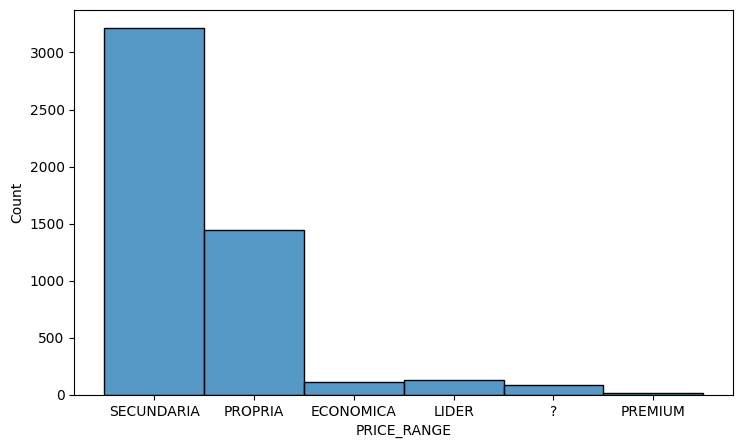

In [8]:
fig, axes = plt.subplots(figsize=(8.5,5), ncols=1, sharey=True)
sns.histplot(data=df_merge.PRICE_RANGE, binwidth=3)

In [9]:
df_merge

,TIME_KEY,TRANSACTION_ID_MASK,CUSTOMER_ACCOUNT_NR_MASK,LOC_BRAND_CD,LOCATION_CD,POS_TP_CD,SKU,PRODUCT_KEY,QTY,NET_SLS_AMT,GROSS_SLS_AMT,PROD_DSCNT_ISSUED_AMT,TRANS_DSCNT_RAT_AMT,DIRECT_DSCNT_AMT,LOCATION_DSC,LOC_BRAND_DSC,cp7,GENDER,FAMILY_MEMBERS,CP4,seg_lifestyle_cd,seg_lifestyle_dsc,SEG_AGE,SEG_AGE_DSC,seg_lifestage_cd,seg_lifestage_dsc,PRODUCT_DSC,UNIT_BASE_CD_EXT,UNIT_BASE_DSC_EXT,SUBCAT_CD_EXT,SUBCAT_DSC_EXT,CAT_CD_EXT,CAT_DSC_EXT,BIZ_UNIT_CD_EXT,BIZ_UNIT_DSC_EXT,DEPARTMENT_CD_EXT,DEPARTMENT_DSC_EXT,PRODUCT_SHORT_DSC,BRAND_DSC,BRAND_TYPE_CD,PRICE_RANGE,CONVERSION_FACTOR,CAPACITY_UNIT
0,20220508,8866258034017223288,83625674.0,303,239,P,7330462,7330462010001,1.0,0.6423,0.79,0.0,0.079010,0,MDL BRAGANCA,continente modelo,5300,F,NaN,5300,1,Qualidade,SA_2,]18;25],5,Active Adults,BLOCO APONT A7 80F 60GR LISO NOTE!,33020224,33020224 - blocos,330202,330202 - cadernos e papel,3302,3302 - papelaria,33,33 - Cultura,23,23 - BAZAR,BLOCO APONT A7,NOTE!,MP,SECUNDARIA,1.00,UN
1,20221102,8756093530610753087,34858968.0,303,239,P,7368462,7368462010001,1.0,1.0163,1.25,0.0,0.000000,0,MDL BRAGANCA,continente modelo,5300,M,3.0,5300,2,Família,SA_5,]45;55],4,Family with Kids,GELATINA CONTINENTE MORANGO 6*100G,8041106,08041106 - Gelatinas Prontas,80411,080411 - sobremesas,804,0804 - iogurtes e sobrem.,8,08 - Laticínios/Beb. Veg.,10,10 - ALIMENTAR,GELATINA MORANG,CONT.POUPANCA,MP,SECUNDARIA,0.60,KG
2,20221111,8765110037131229357,51548719.0,143,4,P,7368462,7368462010001,1.0,1.0163,1.25,0.0,0.318946,0,CNT GAIASHOPPING,continente,4404,M,NaN,4430,2,Família,SA_5,]45;55],5,Active Adults,GELATINA CONTINENTE MORANGO 6*100G,8041106,08041106 - Gelatinas Prontas,80411,080411 - sobremesas,804,0804 - iogurtes e sobrem.,8,08 - Laticínios/Beb. Veg.,10,10 - ALIMENTAR,GELATINA MORANG,CONT.POUPANCA,MP,SECUNDARIA,0.60,KG
3,20220924,8751781569578971342,4817579.0,302,3864,P,7368462,7368462010001,1.0,1.0163,1.25,0.0,0.000000,0,CBD CALDAS TAIPAS,continente bom dia,4805,F,4.0,4805,2,Família,SA_4,]35;45],5,Active Adults,GELATINA CONTINENTE MORANGO 6*100G,8041106,08041106 - Gelatinas Prontas,80411,080411 - sobremesas,804,0804 - iogurtes e sobrem.,8,08 - Laticínios/Beb. Veg.,10,10 - ALIMENTAR,GELATINA MORANG,CONT.POUPANCA,MP,SECUNDARIA,0.60,KG
4,20220912,8740982114387001912,34858968.0,303,239,P,3074985,3074985010001,1.0,0.7236,0.89,0.0,0.000000,0,MDL BRAGANCA,continente modelo,5300,M,3.0,5300,2,Família,SA_5,]45;55],4,Family with Kids,(I)ESPONJA BANHO CONTINENTE 3UN,5030601,05030601 - Outros Acess. Banho,50306,050306 - acessórios banho,503,0503 - higiene corporal,5,05 - Higiene,10,10 - ALIMENTAR,ESPONJA 3UN,CONTINENTE,MP,PROPRIA,3.00,UN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4994,20221230,9137231893782675554,50374079.0,302,4289,P,6574808,6574808010001,1.0,1.3740,1.69,0.0,0.804785,0,CBD V REAL S ANTONIO,continente bom dia,8900,F,NaN,2625,1,Qualidade,SA_4,]35;45],3,Family w/ Young Adul,SALSICHAS CHURRASCO CONTINENTE 200G,13020702,13020702 - salsichas corr ls,130207,130207 - enchidos corr (ls),1302,1302 - Charcutaria,13,13 - Charcutaria&Queijos,12,12 - F&L C&Q PAD TAWAY,SALSICHAS CHURR,CONTINENTE,MP,SECUNDARIA,0.20,KG
4995,20220912,8740982016873536173,75834880.0,302,4289,P,2907937,2907937010001,2.0,1.3982,1.58,0.0,0.000000,0,CBD V REAL S ANTONIO,continente bom dia,8900,M,0.0,8950,1,Qualidade,SA_7,>65,2,Senior,EMPADAS GALINHA CG 80G,18010204,18010204 - empadas e empanadas,180102,180102 - Salgados,1801,1801 - TA Atendimento,18,18 - Take Away,12,12 - F&L C&Q PAD TAWAY,EMPADAS GALINHA,CONTINENTE AT,MP,SECUNDARIA,0.08,KG
4996,20221025,8784113368697550763,57063551.0,302,3609,P,6838203,6838203010001,1.0,1.5000,1.59,0.0,0.000000,0,CBD AVANCA,continente bom dia,3860,M,NaN,0000,2,Família,SA_7,>65,2,Senior,IOG LIQ CONTINENTE MORANGO 1KG,8040404,08040404 - Liq. Familiares,80404,080404 - líquidos,804,0804 - iogurtes e sobrem.,8,08 - Laticínios/Beb. Veg.,10,